# 理想相位/形貌生成
理想带孔径的Fresnel透镜高度形貌生成

g:\software\conda\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Config file: , base.yml  loaded...
Config file: , fresnel_lens.yml  loaded...


c:\Users\xyp\Desktop\dlwl-master\dlwl\utils\load_config.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cfg.loss_params_phase.channel_weight = torch.tensor(cfg.loss_params.channel_weight,device=device).reshape([1,-1,1,1])
c:\Users\xyp\Desktop\dlwl-master\dlwl\utils\load_config.py:46: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cfg.loss_params_phase.batch_weight = torch.tensor(cfg.loss_params.batch_weight,device=device).reshape([-1,1,1,1])


Pixel Size (um)  [1e-06, 1e-06]
Prop. Model:  ASM


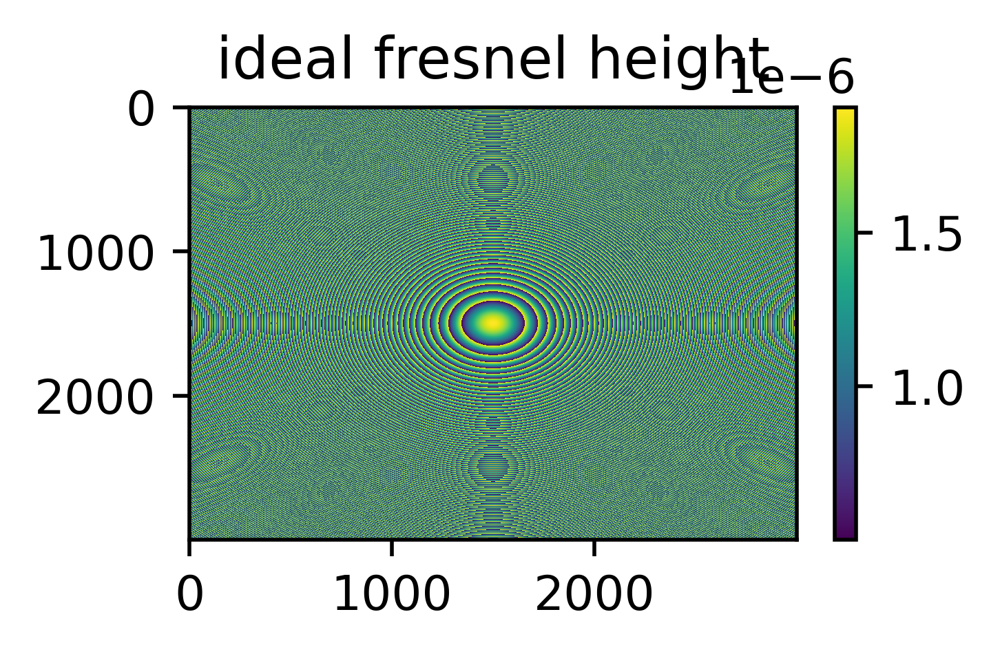

torch.Size([1, 1, 3000, 3000])

In [1]:
import torch
import numpy as np
import utils.utils as utils
from utils.gen_pattern import pattern_selector
from utils.load_config import load_config, update_config, convert_config
from optimize import init_model,e2e_opt,fab_opt,height_opt,fab_eval

dtype = torch.float32
opt = load_config('./config', 'base.yml') #load basic config
opt = update_config(opt,load_config('./config', 'fresnel_lens.yml'))
opt = convert_config(opt)
device = torch.device(opt.device)
propagator, fab_function = init_model(opt,device=device,display=False) # init physical models

input_res = opt.slm_res
pixel_size = opt.feature_size
focal_length = np.array(np.ravel(opt.prop_dist))
wavelength = np.array(np.ravel(opt.wavelength))
refraction_index = np.array(np.ravel(opt.refraction_index))
# focal_length = np.array([200.0e-3])
# focal_length = np.array([100.0e-3, 150.0e-3])
# wavelength = np.array([520.0e-9])
# refraction_index = np.array([1.635])
# wavelength = np.array([940.0e-9])
# refraction_index = np.array([1.61])
# wavelength = np.array([850.0e-9])
# refraction_index = np.array([1.608])

def fresnel_lens(wavelength, focal_length, refraction_index, input_res=(1000,1000), pixel_size=(1.0e-6,1.0e-6)):
     # Create the x, y coordinate grid for the input and aperture
     y = np.linspace(-input_res[0] // 2, input_res[0] // 2, input_res[0]) * pixel_size[0]
     x = np.linspace(-input_res[1] // 2, input_res[1] // 2, input_res[1]) * pixel_size[1]
     xx, yy = np.meshgrid(x, y)
     r_squared = np.expand_dims(np.expand_dims(xx ** 2 + yy ** 2, axis=0),axis=0)
     # wavelength distribution
     wavelength = wavelength.min() + (r_squared - r_squared.min()) * \
                                     (wavelength.max() - wavelength.min()) / (r_squared.max() - r_squared.min())
     refraction_index = refraction_index.min() + (r_squared - r_squared.min()) * \
                                     (refraction_index.max() - refraction_index.min()) / (r_squared.max() - r_squared.min())
     # Focal_lenth distribution
     focal_length = focal_length.min() + (r_squared - r_squared.min()) * \
                                     (focal_length.max() - focal_length.min()) / (r_squared.max() - r_squared.min())
     # Calculate the Fresnel lens phase
     fresnel_phase = np.mod(-2* np.pi/wavelength * \
                              (np.sqrt(r_squared + focal_length**2)-focal_length),
                         2* np.pi)
     height = fresnel_phase / (2*np.pi) * wavelength / (refraction_index-1)
     height = torch.tensor(height,device=device,dtype=dtype)
     return height

height_ideal = fresnel_lens(wavelength, focal_length, refraction_index,input_res,pixel_size) + 0.5e-6


utils.plot_result([height_ideal],
                  ['ideal fresnel height'],
                  channel=0,dpi=500,pytorch=True,
                  figsize=(3,2))
height_ideal.shape


理想带孔径的Fresnel透镜：衍射仿真

Input res. =  (2000, 2000)
Output res. =  [2000, 2000]
Max. Output Size of FSR:  [-0.0, -0.0]
Used Output Size of FSR:  [0.002, 0.002]
Critical range zc:  [0.00396902 0.00204041]
Propagation range z:  0.001


TypeError: Invalid shape (2, 2000, 2000) for image data

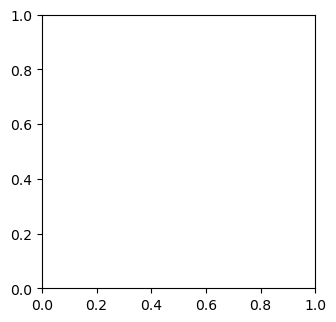

In [87]:
import matplotlib.pyplot as plt
import physical_model as phy
z = 1.0e-3
U1 = utils.propagate_field(height_ideal,propagator=phy.propagation_FFT, 
                        prop_dist=np.array(z).reshape(1,1,1,1), 
                        wavelength=opt.wavelength, 
                        refraction_index=opt.refraction_index,
                        feature_size=opt.feature_size,
                        prop_model='FFT', zfft2=None,
                        normalize=False,
                        output_resolution=opt.output_res,
                        field_type='height',
                        dtype=height_ideal.dtype)
I1 = np.abs(U1.squeeze().cpu().numpy())**2
U2 = utils.propagate_field(height_ideal,propagator=phy.propagation_SFR, 
                        prop_dist=np.array(z).reshape(1,1,1,1), 
                        wavelength=opt.wavelength, 
                        refraction_index=opt.refraction_index,
                        feature_size=opt.feature_size,
                        prop_model='SFR', 
                        output_size=[0.002, 0.002],
                        zfft2=None,
                        normalize=False,
                        output_resolution=opt.output_res,
                        field_type='height',
                        dtype=height_ideal.dtype)
I2 = np.abs(U2.squeeze().cpu().numpy())**2

U3 = utils.propagate_field(height_ideal,propagator=phy.propagation_ASM, 
                        prop_dist=np.array(z).reshape(1,1,1,1), 
                        wavelength=opt.wavelength, 
                        refraction_index=opt.refraction_index,
                        feature_size=opt.feature_size,
                        prop_model='ASM', 
                        output_size=[0.001, 0.001],
                        zfft2=None,
                        normalize=False,
                        output_resolution=opt.output_res,
                        field_type='height',
                        dtype=height_ideal.dtype)
I3 = np.abs(U3.squeeze().cpu().numpy())**2

plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.imshow(utils.pow2db(I1,db_min=-70), cmap='viridis')
plt.title('FFT')
plt.colorbar()
plt.subplot(1,3,2)
plt.imshow(I2, cmap='viridis')
plt.title(f'SFR at z = {z:.4f} m')
plt.colorbar()
plt.subplot(1,3,3)
plt.imshow(I3, cmap='viridis')
plt.title(f'ASM at z = {z:.4f} m')
plt.colorbar()
plt.show()

print('SPOT ratio, FFT: ', utils.calculate_ratio(I1,0.3,pytorch=False))
print('SPOT ratio, SFR: ', utils.calculate_ratio(I2,0.1,pytorch=False))
print('SPOT ratio, ASM: ', utils.calculate_ratio(I3,0.1,pytorch=False))

print('SFR energy',np.sum(I2))
print('ASM energy',np.sum(I3))


# Direct/2step 初始化
- 读取模型参数 `opt`
- 通过GS优化Fresnel透镜形貌

In [2]:
import os
import cv2  
import torch
import numpy as np
import utils.utils as utils
import matplotlib.pyplot as plt
from utils.gen_pattern import pattern_selector
from utils.load_config import load_config, update_config, convert_config
from optimize import init_model,e2e_opt,fab_opt,height_opt,fab_eval

dtype = torch.float32
opt = load_config('./config', 'base.yml') #load basic config
opt=update_config(opt,load_config('./config', 'fresnel_lens_2step.yml'))
opt = convert_config(opt)
device = torch.device(opt.device)
propagator, fab_function = init_model(opt,device=device,display=False) # init physical models

# ###### Gen. Target Pattern
# opt, target_amp = pattern_selector(opt,plot=False,
#                     device=device,dtype=dtype)
######### height opt
# height_2pi = float(opt[0].wavelength[0]/(opt[0].refraction_index[0]-1))
# height_gs, recon_amp = height_opt(opt,target_amp,
#                                 propagator,
#                                 height_2pi,
#                                 plot_result = False,
#                                 output = True,
#                                 device=device)
# height_gs = height_gs[0]

Config file: , base.yml  loaded...
Config file: , fresnel_lens_2step.yml  loaded...
Pixel Size (um)  [1e-06, 1e-06]
Prop. Model:  ASM


## Direct直接映射法
得到加工dose，计算模拟实际加工相位

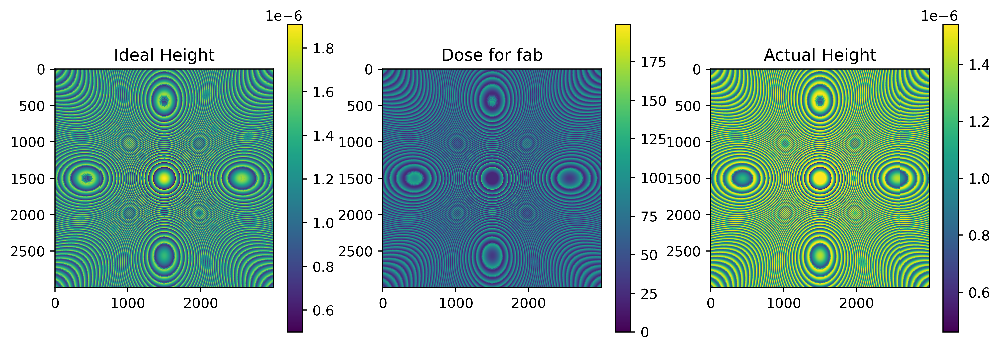

In [2]:
import matplotlib.pyplot as plt
########## direct dose mapping
# ideal phase -> dose
direct_dose = utils.fabrication_field(height_ideal, opt.aperture_type,
                        fab_model=fab_function, 
                        fab_backward=True)
# simulation for actual phase
height_actual = utils.fabrication_field(direct_dose, opt.aperture_type,
                        fab_function, fab_backward=False)

plt.figure(figsize=(12,4),dpi=500)
plt.subplot(1,3,1)
plt.imshow(height_ideal.squeeze().cpu().numpy(), cmap='viridis')
plt.title(f'Ideal Height')
plt.colorbar()
plt.subplot(1,3,2)
plt.imshow(direct_dose.squeeze().cpu().numpy(), cmap='viridis')
plt.title(f'Dose for fab')
plt.colorbar()
plt.subplot(1,3,3)
plt.imshow(height_actual.squeeze().cpu().numpy(), cmap='viridis')
plt.title(f'Actual Height')
plt.colorbar()
plt.show()


### Direct eval
direct映射 效果仿真与对比

Critical range zc:  [0.00396902 0.00365529 0.0034641  0.00328525 0.00311728 0.00280902
 0.00266667 0.00233826 0.00204041]
Propagation range z:  0.001
Critical range zc:  [0.00396902 0.00365529 0.0034641  0.00328525 0.00311728 0.00280902
 0.00266667 0.00233826 0.00204041]
Propagation range z:  0.001


c:\Users\xyp\Desktop\dlwl-master\dlwl\utils\utils.py:667: RuntimeWarning: divide by zero encountered in log10
  return np.where(pow<=10**(db_min/10),db_min, 10*np.log10(pow))


TypeError: Invalid shape (9, 2000, 2000) for image data

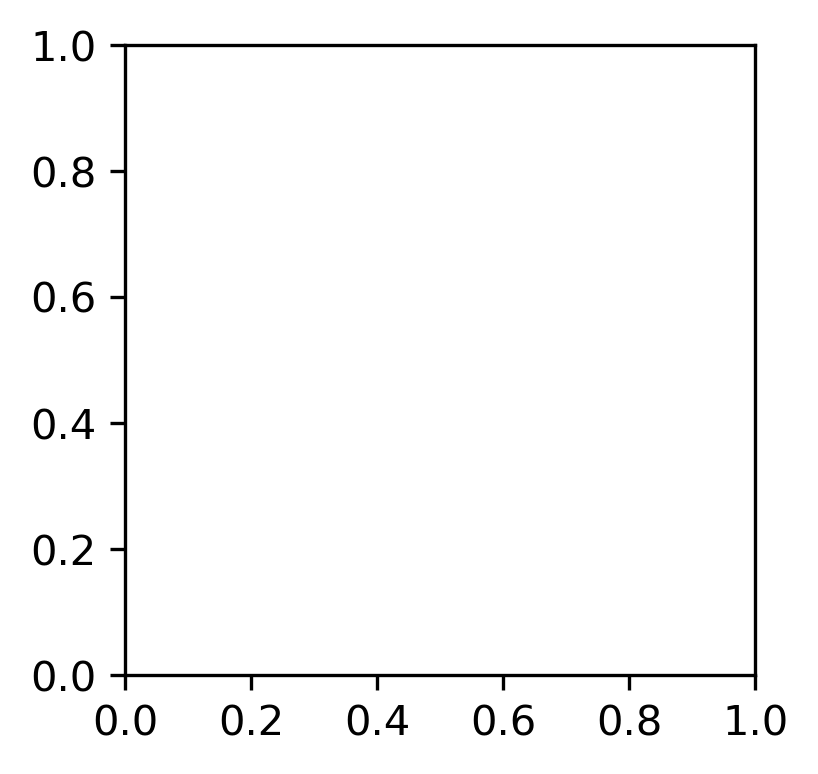

In [7]:
###### eval
import physical_model as phy
z = 1.0e-3
wavelength = opt.wavelength
refraction_index = opt.refraction_index
input_res = opt.slm_res
feature_size=opt.feature_size
U1 = utils.propagate_field(height_ideal,
                            propagator=phy.propagation_FFT, 
                            prop_dist=np.array(z).reshape(1,1,1,1), wavelength=wavelength, 
                            refraction_index = refraction_index,
                            feature_size=feature_size,
                            prop_model='FFT', zfft2=None,
                            normalize=False,
                            output_resolution=input_res,
                            field_type='height',
                            dtype=height_ideal.dtype)
I1 = np.abs(U1.squeeze().cpu().numpy())**2
U2 = utils.propagate_field(height_ideal,
                            propagator=phy.propagation_ASM, 
                            prop_dist=np.array(z).reshape(1,1,1,1), wavelength=wavelength, 
                            refraction_index = refraction_index,
                            feature_size=feature_size,
                            prop_model='ASM', zfft2=None,
                            normalize=False,
                            output_resolution=input_res,
                            field_type='height',
                            dtype=height_ideal.dtype)
I2 = np.abs(U2.squeeze().cpu().numpy())**2

U3 = utils.propagate_field(height_actual,
                            propagator=phy.propagation_FFT, 
                            prop_dist=np.array(z).reshape(1,1,1,1), wavelength=wavelength, 
                            refraction_index = refraction_index,
                            feature_size=feature_size,
                            prop_model='FFT', zfft2=None,
                            normalize=False,
                            output_resolution=input_res,
                            field_type='height',
                            dtype=height_ideal.dtype)
I3 = np.abs(U3.squeeze().cpu().numpy())**2
U4 = utils.propagate_field(height_actual,
                            propagator=phy.propagation_ASM, 
                            prop_dist=np.array(z).reshape(1,1,1,1), wavelength=wavelength, 
                            refraction_index = refraction_index,
                            feature_size=feature_size,
                            prop_model='ASM', zfft2=None,
                            normalize=False,
                            output_resolution=input_res,
                            field_type='height',
                            dtype=height_ideal.dtype)
I4 = np.abs(U4.squeeze().cpu().numpy())**2

##### results for ideal phase                    
plt.figure(figsize=(12,6),dpi=300)
plt.subplot(2,2,1)
plt.imshow(utils.pow2db(I1,db_min=-70), cmap='viridis')
plt.title('FFT')
plt.colorbar()
plt.subplot(2,2,2)
plt.imshow(utils.pow2db(I2,db_min=-70), cmap='viridis')
plt.title(f'ASM at z = {z:.4f} m')
plt.colorbar()
plt.subplot(2,2,3)
plt.imshow(utils.pow2db(I3,db_min=-70), cmap='viridis')
plt.title('FFT (w/ fab)')
plt.colorbar()
plt.subplot(2,2,4)
plt.imshow(utils.pow2db(I4,db_min=-70), cmap='viridis')
plt.title(f'ASM (w/ fab) at z = {z:.4f} m')
plt.colorbar()
plt.show()

print('SPOT ratio, FFT: ', utils.calculate_ratio(I1,0.3,pytorch=False))
print('SPOT ratio, ASM: ', utils.calculate_ratio(I2,0.1,pytorch=False))
print('SPOT ratio, FFT (w/ fab): ', utils.calculate_ratio(I3,0.3,pytorch=False))
print('SPOT ratio, ASM (w/ fab): ', utils.calculate_ratio(I4,0.1,pytorch=False))

## 2-step优化
用两步法实现dose优化

In [34]:
import os
import cv2  
import torch
import numpy as np
import utils.utils as utils
import matplotlib.pyplot as plt
from utils.gen_pattern import pattern_selector
from utils.load_config import load_config, update_config, convert_config
from optimize import init_model,e2e_opt,fab_opt,height_opt,fab_eval

dtype = torch.float32
opt = load_config('./config', 'base.yml') #load basic config
opt=update_config(opt,load_config('./config', 'fresnel_lens_2step.yml'))
opt = convert_config(opt)
device = torch.device(opt.device)
propagator, fab_function = init_model(opt,device=device,display=False) # init physical models

###### Gen. Target Pattern
opt, target_amp = pattern_selector(opt,plot=False,
                    device=device,dtype=dtype)
                    
# fab opt
# ideal height -> optimizaed dose
opt[0].optim_params.lr = 1.0e+7
opt[0].optim_params.num_iters = 5000
dose_2step, _, _ = fab_opt(opt,[height_ideal],
                                propagator, fab_function,
                                start_point='inverse',
                                plot_result = False,
                                output = True,
                                device=device)
dose_2step = torch.tensor(dose_2step[0]).to(dtype=height_ideal.dtype,device=device)[None,None,:,:]

Config file: , base.yml  loaded...
Config file: , fresnel_lens_2step.yml  loaded...
Pixel Size (um)  [1e-06, 1e-06]
Prop. Model:  ASM
Batch #  0
1
Loss:  1.5788347e-08
101
Loss:  6.742517e-11
201
Loss:  6.2666865e-11
301
Loss:  6.35887e-11
401
Loss:  6.401342e-11
501
Loss:  6.352631e-11
601
Loss:  6.2948924e-11
701
Loss:  6.1357835e-11
801
Loss:  6.293573e-11
901
Loss:  6.4294695e-11
1001
Loss:  6.3155356e-11
1101
Loss:  6.56224e-11
1201
Loss:  6.399916e-11
1301
Loss:  6.435004e-11
1401
Loss:  6.544247e-11
1501
Loss:  6.403022e-11
1601
Loss:  6.6440776e-11
1701
Loss:  6.353974e-11
1801
Loss:  6.0289676e-11
1901
Loss:  6.599159e-11
2001
Loss:  6.5989963e-11
2101
Loss:  6.4166235e-11
2201
Loss:  6.570502e-11
2301
Loss:  6.058498e-11
2401
Loss:  6.460392e-11
2501
Loss:  6.5518674e-11
2601
Loss:  6.671492e-11
2701
Loss:  6.586777e-11
2801
Loss:  6.497771e-11
2901
Loss:  6.271606e-11
3001
Loss:  6.4039024e-11
3101
Loss:  5.966558e-11
3201
Loss:  6.610551e-11
3301
Loss:  6.422743e-11
3401
Lo

### eval for 2-step

Critical range zc:  0.0032852548467788654
Propagation range z:  0.001


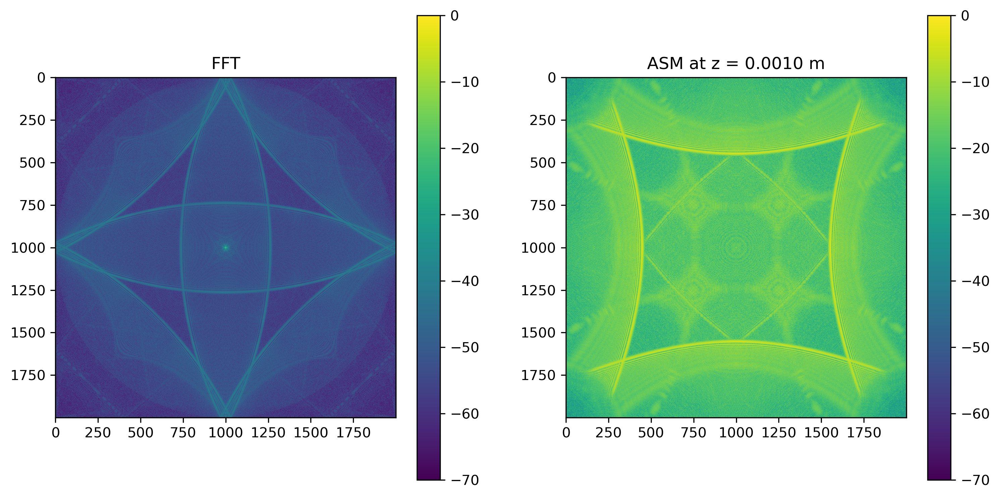

SPOT ratio, FFT (2step):  0.16798893
SPOT ratio, ASM (2step):  0.007048526


In [84]:
###### eval for 2-step
import physical_model as phy
z = 1.0e-3
lam = 520.0e-9
# simulation 
height_2step = utils.fabrication_field(dose_2step, opt[0].aperture_type,
                        fab_function, fab_backward=False)
U1 = utils.propagate_field(height_2step,
                            propagator=phy.propagation_FFT, 
                            prop_dist=np.array(z).reshape(1,1,1,1), 
                            wavelength=np.array(lam).reshape(1,1,1,1), 
                            refraction_index = opt[0].refraction_index,
                            feature_size=opt[0].feature_size,
                            prop_model='FFT', zfft2=None,
                            normalize=False,
                            output_resolution=opt[0].output_res,
                            field_type='height',
                            dtype=height_2step.dtype)
U2 = utils.propagate_field(height_2step,
                            propagator=phy.propagation_ASM, 
                            prop_dist=np.array(z).reshape(1,1,1,1),
                            wavelength=np.array(lam).reshape(1,1,1,1), 
                            refraction_index = opt[0].refraction_index,
                            feature_size=opt[0].feature_size,
                            prop_model='ASM', zfft2=None,
                            normalize=False,
                            output_resolution=opt[0].output_res,
                            field_type='height',
                            dtype=height_2step.dtype)
I1 = np.abs(U1.squeeze().cpu().numpy())**2
I2 = np.abs(U2.squeeze().cpu().numpy())**2


##### results for ideal phase                    
plt.figure(figsize=(12,6),dpi=300)
plt.subplot(1,2,1)
plt.imshow(utils.pow2db(I1,db_min=-70), cmap='viridis')
plt.title('FFT')
plt.colorbar()
plt.subplot(1,2,2)
plt.imshow(utils.pow2db(I2,db_min=-70), cmap='viridis')
plt.title(f'ASM at z = {z:.4f} m')
plt.colorbar()
plt.show()

print('SPOT ratio, FFT (2step): ', utils.calculate_ratio(I1,0.3,pytorch=False))
print('SPOT ratio, ASM (2step): ', utils.calculate_ratio(I2,0.1,pytorch=False))

# E2E初始化&优化
E2E实现dose优化

In [3]:
import os
import cv2  
import torch
import numpy as np
import utils.utils as utils
import matplotlib.pyplot as plt
from utils.gen_pattern import pattern_selector
from utils.load_config import load_config, update_config, convert_config
from optimize import init_model,e2e_opt,fab_opt,height_opt,fab_eval

dtype = torch.float32
opt = load_config('./config', 'base.yml') #load basic config
opt= update_config(opt,load_config('./config', 'fresnel_lens.yml'))
opt = convert_config(opt)
device = torch.device(opt.device)
propagator, fab_function = init_model(opt,device=device,display=False) # init physical models

###### Gen. Target Pattern
opt, target_amp = pattern_selector(opt,plot=False,
                    device=device,dtype=dtype)
###### E2E Optimization
opt[0].optim_params.lr = 10.0
opt[0].optim_params.lr_s = 0.1e-5
opt[0].optim_params.num_iters = 20000
opt[0].loss_params.eff_penalty_weight = 0
opt[0].loss_params.eff_penalty_ratio = 0.1
dose_out_8bit, _, _ = e2e_opt(opt,target_amp,
                                propagator, fab_function,
                                plot_result = False,
                                plot_log_scale=False,
                                # init_value=dose_2step,
                                init_value=direct_dose,
                                # init_value=None,
                                # init_value=dose_e2e,
                                output = False,
                                device=device)
dose_e2e = torch.tensor(dose_out_8bit[0]).to(dtype=height_ideal.dtype,device=device)[None,None,:,:]

Config file: , base.yml  loaded...
Config file: , fresnel_lens.yml  loaded...
Pixel Size (um)  [1e-06, 1e-06]
Prop. Model:  ASM
Batch #  0
Critical range zc:  0.012779200228398827
Propagation range z:  [0.014286 0.015    0.016    0.017    0.0185   0.019608]
1
Loss:  0.68805426
101
Loss:  0.28970003
201
Loss:  0.26873812
301
Loss:  0.257338
401
Loss:  0.24984911
501
Loss:  0.24314272
601
Loss:  0.23794504
701
Loss:  0.23504803
801
Loss:  0.23329239
901
Loss:  0.23174149
1001
Loss:  0.22905274
1101
Loss:  0.22682793
1201
Loss:  0.22584666
1301
Loss:  0.22515848
1401
Loss:  0.22418274
1501
Loss:  0.22160968
1601
Loss:  0.22102015
1701
Loss:  0.22066002
1801
Loss:  0.22037314
1901
Loss:  0.22013445
2001
Loss:  0.21992922
2101
Loss:  0.21974704
2201
Loss:  0.21958031
2301
Loss:  0.21942747
2401
Loss:  0.21928401
2501
Loss:  0.21914814
2601
Loss:  0.21902147
2701
Loss:  0.21890286
2801
Loss:  0.21879196
2901
Loss:  0.21868768
3001
Loss:  0.21859021
3101
Loss:  0.21849841
3201
Loss:  0.218407

IndexError: list index out of range

## eval for e2e

Critical range zc:  0.008519466818932552
Propagation range z:  0.9
Input res. =  (2000, 2000)
Output res. =  [2000, 2000]
Max. Output Size of FSR:  [0.763, 0.763]
Used Output Size of FSR:  [0.002, 0.002]


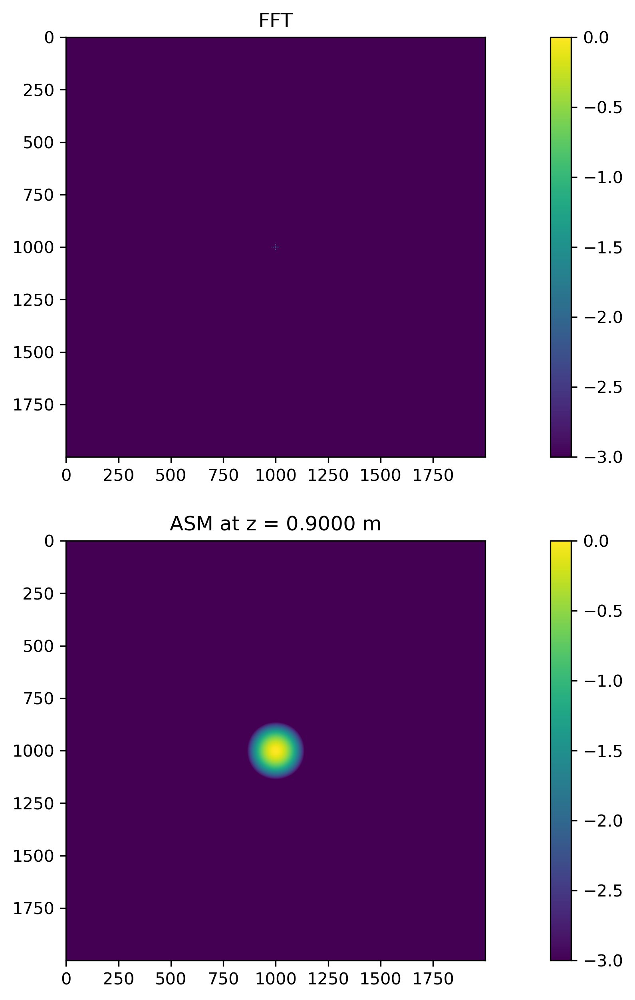

SPOT ratio, FFT (e2e):  0.9005077
SPOT ratio, ASM (e2e):  0.008801379290981569
SPOT ratio, SFR (e2e):  0.2706418


In [59]:
###### eval for e2e
import physical_model as phy
import utils.utils as utils
z = 900.0e-3
lam = [850.0e-9]
index = [1.608]
# lam = [500.0e-9, 520.0e-9, 540.0e-9]
# index = [1.65, 1.637, 1.623]
# lam =  [450.0e-9, 520.0e-9, 650.0e-9]
# index = [1.65, 1.637, 1.62]
# simulation 
db_min = -3
height_e2e = utils.fabrication_field(dose_e2e, opt[0].aperture_type,
                        fab_function, fab_backward=False)
U1 = utils.propagate_field(height_e2e,
                            propagator=phy.propagation_FFT, 
                            prop_dist=np.array(z).reshape(1,1,1,1), 
                            wavelength=np.array(lam).reshape(1,-1,1,1), 
                            refraction_index = np.array(index).reshape(1,-1,1,1),
                            feature_size=opt[0].feature_size,
                            prop_model='FFT', zfft2=None,
                            normalize=False,
                            output_resolution=opt[0].output_res,
                            field_type='height',
                            dtype=height_e2e.dtype)
U2 = utils.propagate_field(height_e2e,
                            propagator=phy.propagation_ASM, 
                            prop_dist=np.array(z).reshape(1,1,1,1),
                            wavelength=np.array(lam).reshape(1,-1,1,1), 
                            refraction_index = np.array(index).reshape(1,-1,1,1),
                            feature_size=opt[0].feature_size,
                            prop_model='ASM', zfft2=None,
                            normalize=False,
                            output_resolution=opt[0].output_res,
                            field_type='height',
                            dtype=height_e2e.dtype)
sfr_size = 0.002
U3 = utils.propagate_field(height_e2e,
                            propagator=phy.propagation_SFR, 
                            prop_dist=np.array(z).reshape(1,1,1,1),
                            wavelength=np.array(lam).reshape(1,-1,1,1), 
                            refraction_index = np.array(index).reshape(1,-1,1,1),
                            feature_size=opt[0].feature_size,
                            prop_model='SFR', zfft2=None,
                            normalize=False,
                            output_size=[sfr_size,sfr_size],
                            output_resolution=opt[0].output_res,
                            field_type='height',
                            dtype=height_e2e.dtype)
I1 = np.abs(U1.squeeze(0).cpu().numpy())**2
I2 = np.abs(U2.squeeze(0).cpu().numpy())**2
I3 = np.abs(U3.squeeze(0).cpu().numpy())**2


##### results for ideal phase                    
plt.figure(figsize=(14,10),dpi=300)
channel_num = I1.shape[0]
j = 1
for i in range(channel_num):
    plt.subplot(2,channel_num,j)
    j +=1
    plt.imshow(utils.pow2db(I1[i],db_min=db_min), cmap='viridis')
    plt.title('FFT')
    plt.colorbar()
    plt.subplot(2,channel_num,j)
    j +=1
    plt.imshow(utils.pow2db(I2[i],db_min=db_min), cmap='viridis')
    plt.title(f'ASM at z = {z:.4f} m')
    plt.colorbar()
    # plt.subplot(2,channel_num,j)
    # j +=1
    # plt.imshow(utils.pow2db(I3[i],db_min=-70), cmap='viridis')
    # plt.title(f'SFR at z = {z:.4f} m')
    # plt.colorbar()
plt.show()
r0 = I2[0].sum()/(I2[0].shape[0]*I2[0].shape[1])
print('SPOT ratio, FFT (e2e): ', utils.calculate_ratio(I1[0],0.4,pytorch=False))
print('SPOT ratio, ASM (e2e): ', r0*utils.calculate_ratio(I2[0],0.2,pytorch=False))
print('SPOT ratio, SFR (e2e): ', utils.calculate_ratio(I3[0],0.2,pytorch=False))